<a href="https://colab.research.google.com/github/abdulmoizniazi/Exploratory_Data_Analysis/blob/main/CV_Task01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
from google.colab.patches import cv2_imshow # Import the necessary function

image = cv2.imread('/content/image1.jpg')
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
inverted = 255 - gray_image
blurred = cv2.GaussianBlur(inverted, (21, 21), 0)
inverted_blurred = 255 - blurred
pencil_sketch = cv2.divide(gray_image, inverted_blurred, scale=256.0)

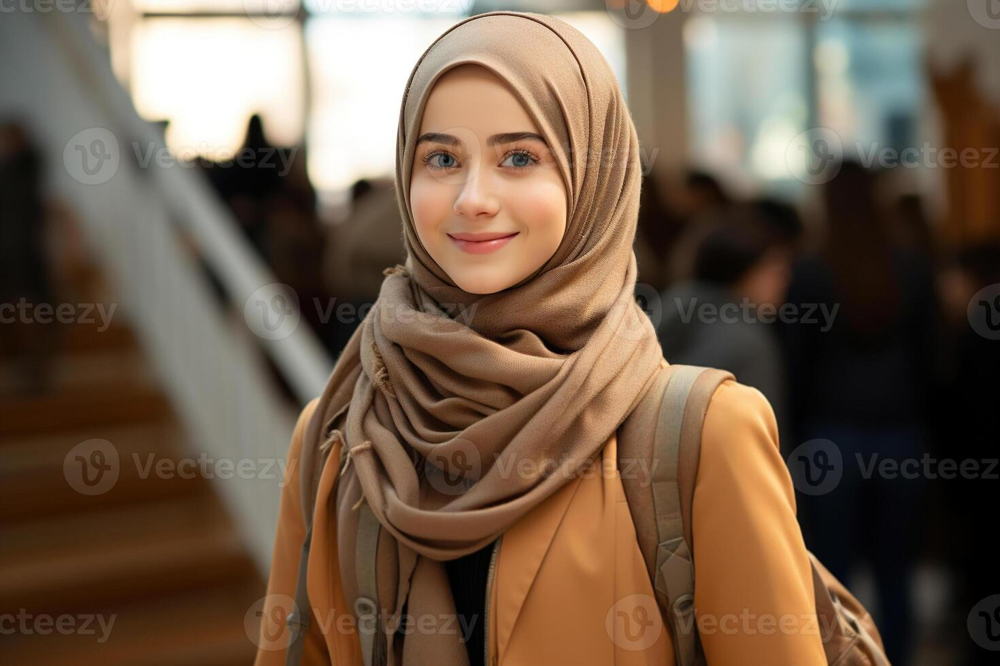

-1

In [ ]:
cv2_imshow(image) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)

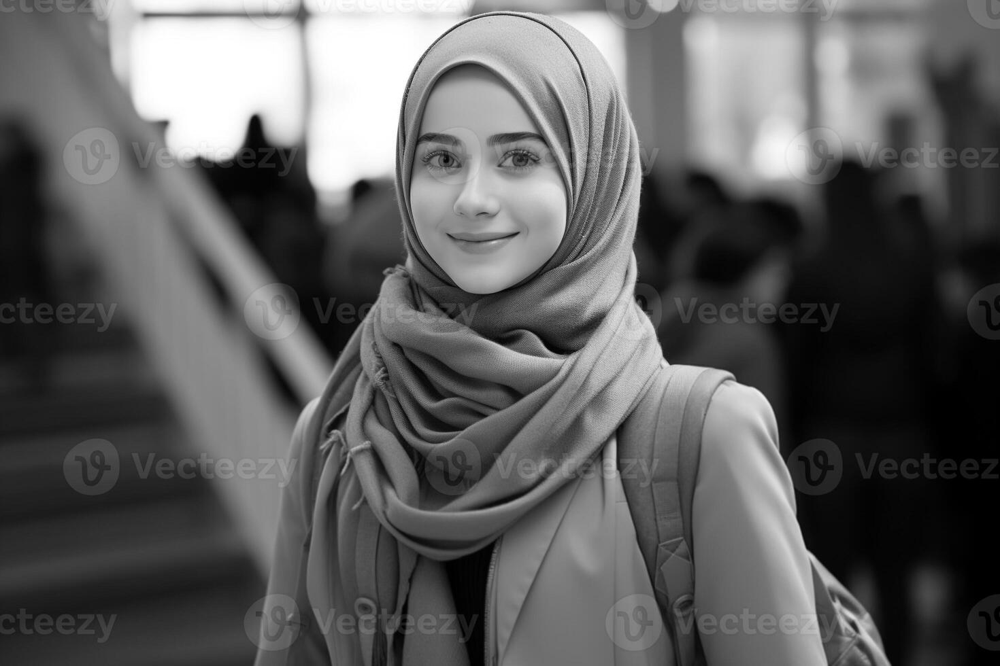

-1

In [ ]:
cv2_imshow(gray_image) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)

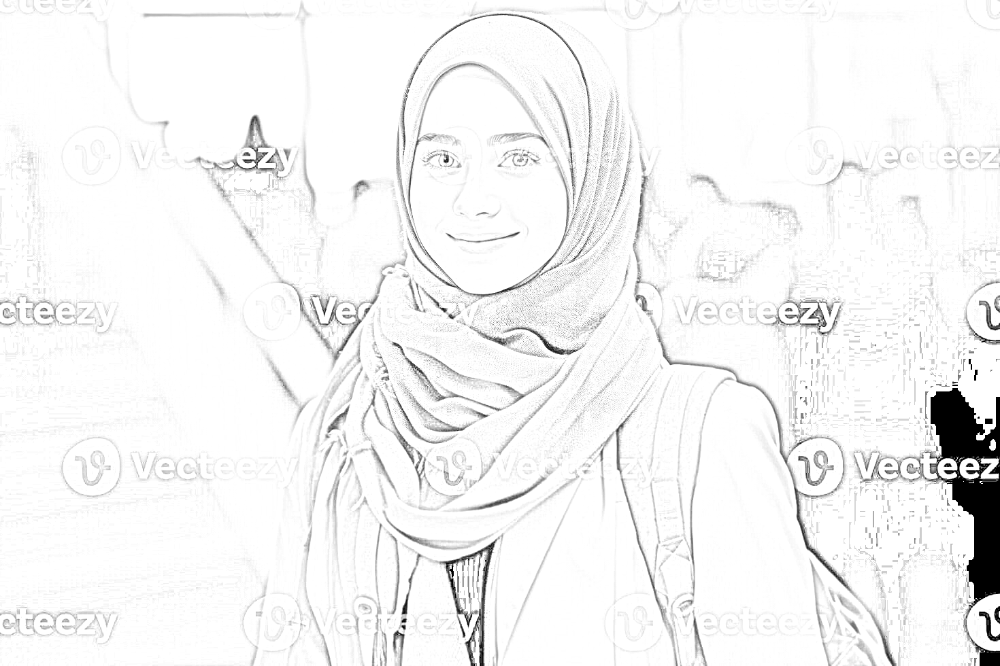

-1

In [ ]:
import cv2
from google.colab.patches import cv2_imshow # Import the necessary function

image = cv2.imread('/content/image1.jpg')
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
inverted = 255 - gray_image
blurred = cv2.GaussianBlur(inverted, (21, 21), 0)
inverted_blurred = 255 - blurred
pencil_sketch = cv2.divide(gray_image, inverted_blurred, scale=256.0)
cv2_imshow(pencil_sketch) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)

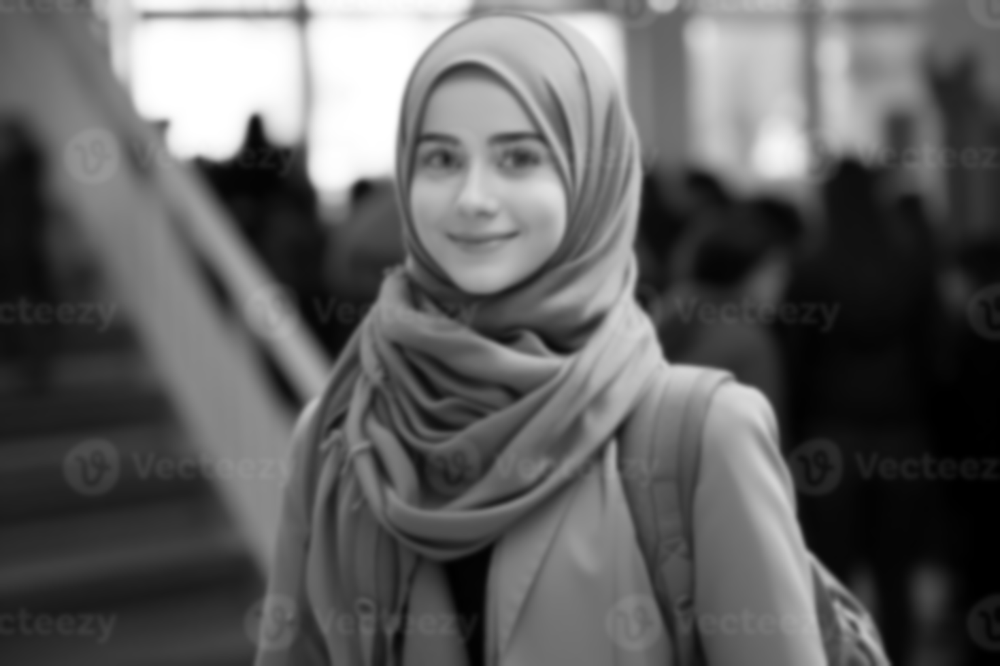

-1

In [ ]:
cv2_imshow(inverted_blurred) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)

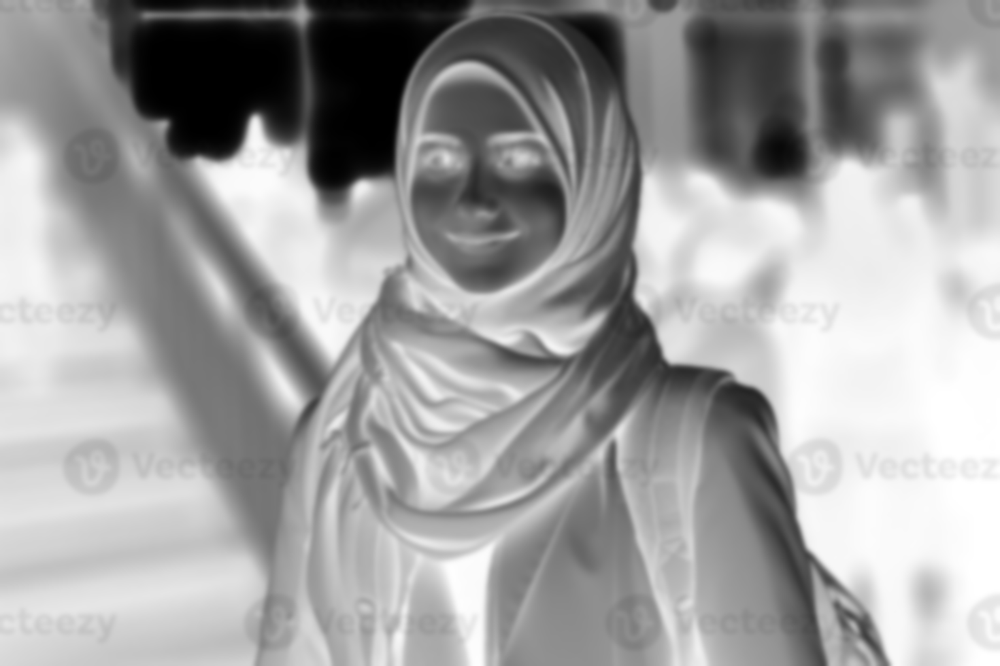

-1

In [ ]:
cv2_imshow(blurred) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)

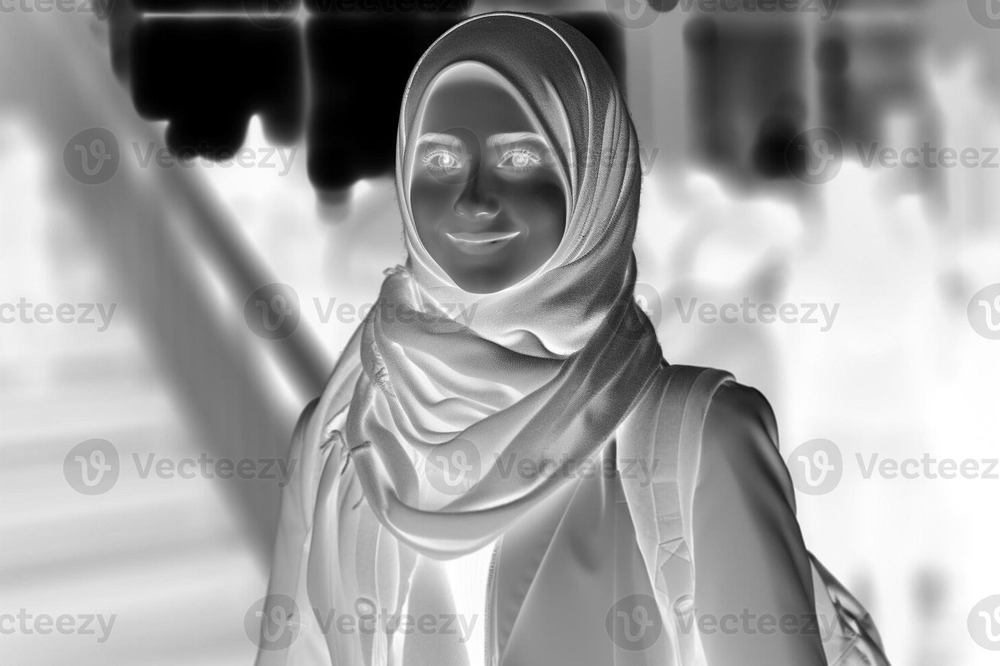

-1

In [ ]:
cv2_imshow(inverted) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)

CONTRAST ENHANCEMENT

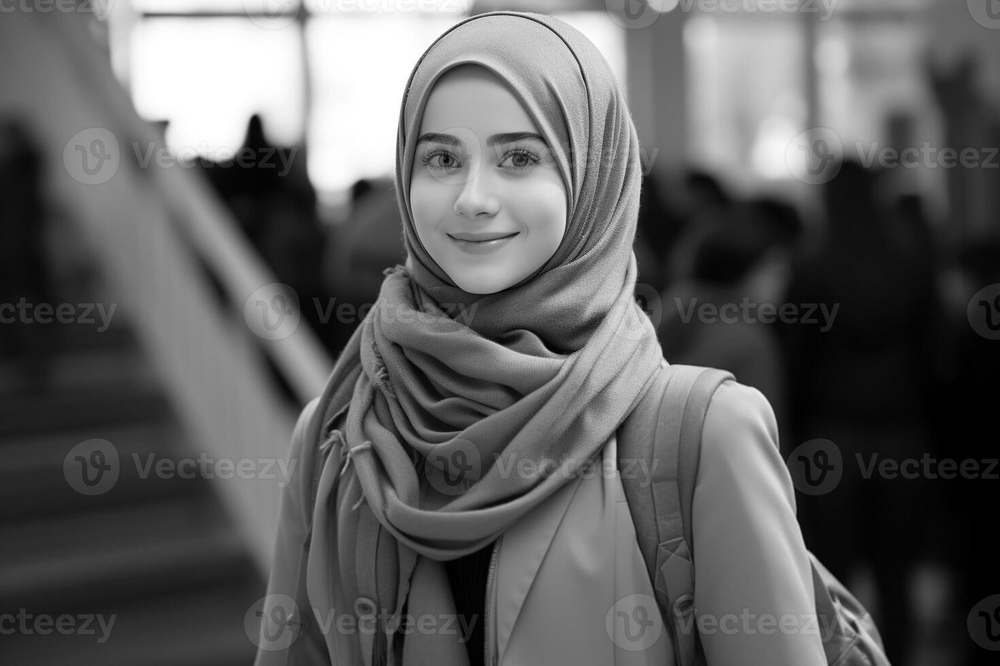

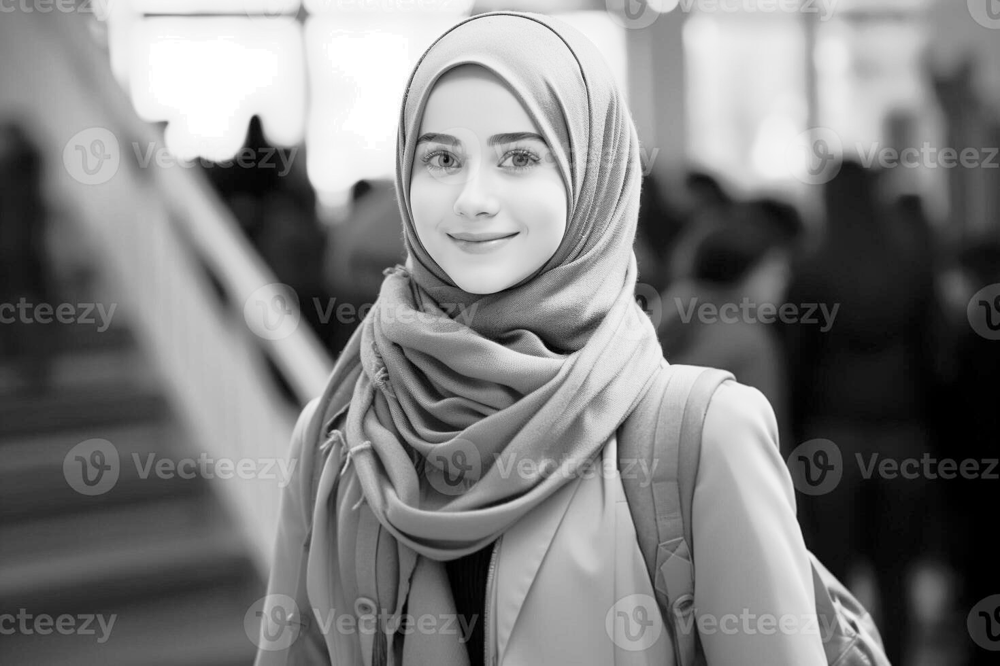

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow # Import cv2_imshow

# Load grayscale image
image = cv2.imread('/content/image1.jpg', cv2.IMREAD_GRAYSCALE)

# Apply Histogram Equalization
equalized_image = cv2.equalizeHist(image)

# Display original and equalized images using cv2_imshow
cv2_imshow(image) # Use cv2_imshow instead of cv2.imshow
cv2_imshow(equalized_image) # Use cv2_imshow instead of cv2.imshow
cv2.waitKey(0)
cv2.destroyAllWindows()

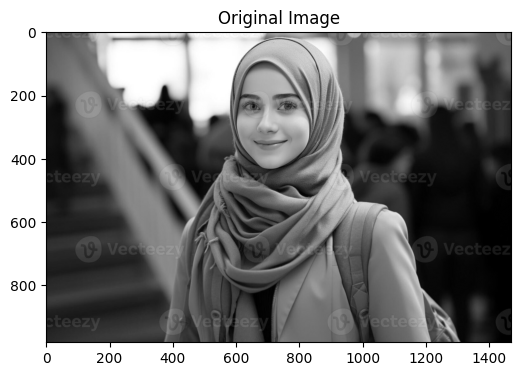

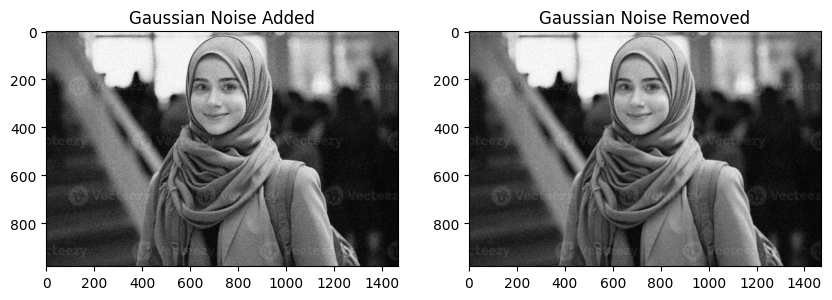

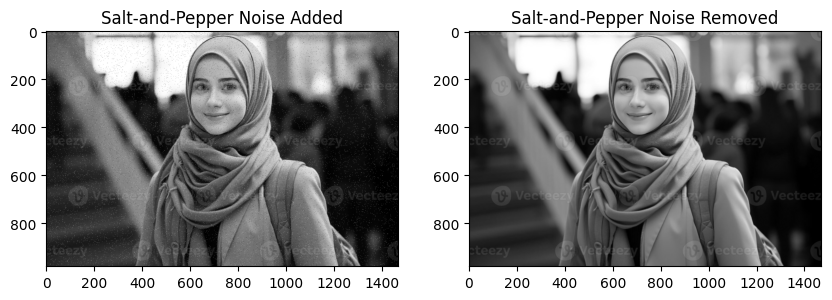

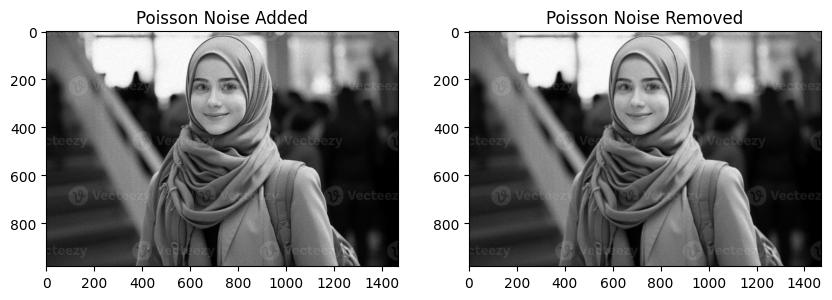

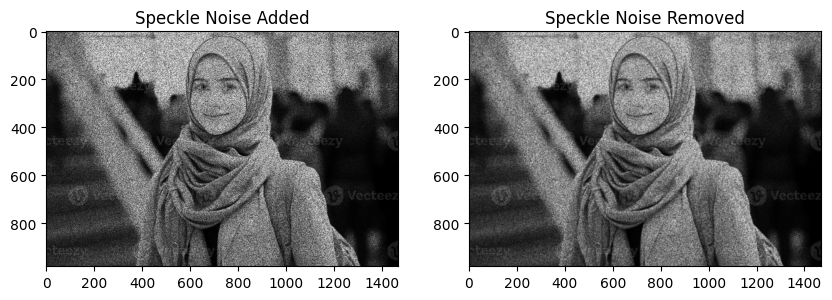

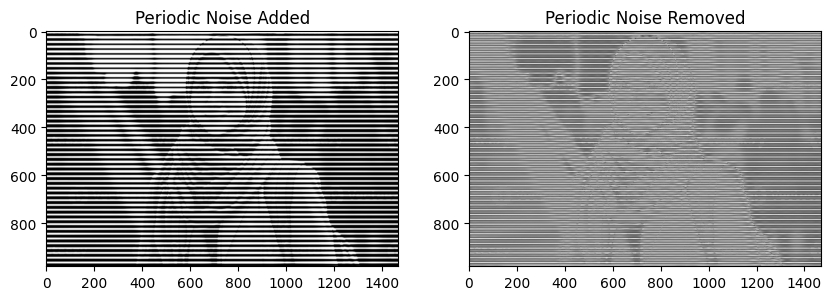

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load and display the original image
image = cv2.imread('/content/image1.jpg', cv2.IMREAD_GRAYSCALE) / 255.0
plt.figure(figsize=(6, 6))
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.show()

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, var=0.01):
    sigma = var ** 0.5
    gaussian = np.random.normal(mean, sigma, image.shape)
    return np.clip(image + gaussian, 0, 1)

# Function to remove Gaussian noise using Gaussian Blur
def remove_gaussian_noise(image, kernel_size=5):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)

# Function to add Salt-and-Pepper noise
def add_salt_and_pepper_noise(image, amount=0.02):
    noisy_image = np.copy(image)
    num_salt = np.ceil(amount * image.size * 0.5)
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_image[tuple(coords)] = 1
    num_pepper = np.ceil(amount * image.size * 0.5)
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_image[tuple(coords)] = 0
    return noisy_image

# Function to remove Salt-and-Pepper noise using Median Filter
def remove_salt_and_pepper_noise(image, kernel_size=3):
    return cv2.medianBlur((image * 255).astype(np.uint8), kernel_size) / 255.0

# Function to add Poisson noise
def add_poisson_noise(image):
    noisy_image = np.random.poisson(image * 255) / 255.0
    return np.clip(noisy_image, 0, 1)

# Function to add Speckle noise
def add_speckle_noise(image):
    gaussian = np.random.randn(*image.shape)
    noisy_image = image + image * gaussian
    return np.clip(noisy_image, 0, 1)

# Function to add Periodic noise
def add_periodic_noise(image, frequency=20):
    rows, cols = image.shape
    periodic_noise = np.sin(2 * np.pi * np.arange(rows) / frequency).reshape(rows, 1)
    noisy_image = image + periodic_noise
    return np.clip(noisy_image, 0, 1)

# Removing Periodic noise using Fourier Transform
def remove_periodic_noise(image):
    f = np.fft.fft2(image)
    fshift = np.fft.fftshift(f)
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.ones((rows, cols), np.uint8)
    r = 30
    mask[crow - r:crow + r, ccol - r:ccol + r] = 0
    fshift = fshift * mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.abs(np.fft.ifft2(f_ishift))
    return np.clip(img_back, 0, 1)

# Display and denoise each type of noise
noises = {
    "Gaussian Noise": (add_gaussian_noise, remove_gaussian_noise),
    "Salt-and-Pepper Noise": (add_salt_and_pepper_noise, remove_salt_and_pepper_noise),
    "Poisson Noise": (add_poisson_noise, remove_gaussian_noise),
    "Speckle Noise": (add_speckle_noise, remove_gaussian_noise),
    "Periodic Noise": (add_periodic_noise, remove_periodic_noise),
}

for noise_name, (add_func, remove_func) in noises.items():
    noisy_image = add_func(image)
    plt.figure(figsize=(10, 5))
    plt.subplot(121), plt.imshow(noisy_image, cmap='gray'), plt.title(f'{noise_name} Added')

    denoised_image = remove_func(noisy_image)
    plt.subplot(122), plt.imshow(denoised_image, cmap='gray'), plt.title(f'{noise_name} Removed')
    plt.show()


EDGE DETECTION

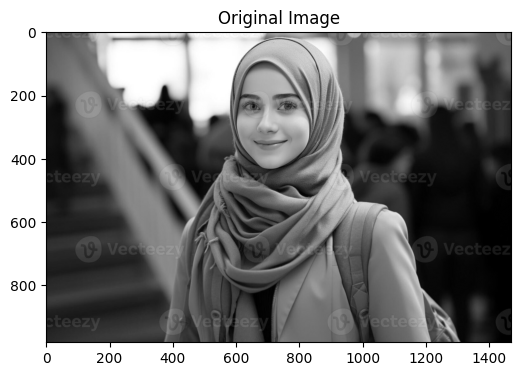

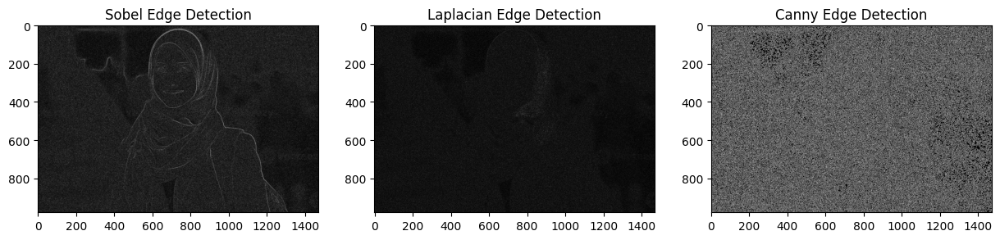

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load and display the original image
image = cv2.imread('/content/image1.jpg', cv2.IMREAD_GRAYSCALE) / 255.0
plt.figure(figsize=(6, 6))
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.show()

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, var=0.01):
    sigma = var ** 0.5
    gaussian = np.random.normal(mean, sigma, image.shape)
    return np.clip(image + gaussian, 0, 1)

# Sobel edge detection
def sobel_edge_detection(image):
    sobelx = cv2.Sobel((image * 255).astype(np.uint8), cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel((image * 255).astype(np.uint8), cv2.CV_64F, 0, 1, ksize=3)
    sobel = np.sqrt(sobelx**2 + sobely**2)
    return np.clip(sobel / sobel.max(), 0, 1)

# Laplacian edge detection
def laplacian_edge_detection(image):
    laplacian = cv2.Laplacian((image * 255).astype(np.uint8), cv2.CV_64F)
    return np.clip(laplacian / laplacian.max(), 0, 1)

# Canny edge detection
def canny_edge_detection(image, low_threshold=50, high_threshold=150):
    return cv2.Canny((image * 255).astype(np.uint8), low_threshold, high_threshold) / 255.0

# Display images with edge detection
noisy_image = add_gaussian_noise(image)
plt.figure(figsize=(15, 5))

# Sobel edge detection
sobel_edges = sobel_edge_detection(noisy_image)
plt.subplot(131), plt.imshow(sobel_edges, cmap='gray'), plt.title('Sobel Edge Detection')

# Laplacian edge detection
laplacian_edges = laplacian_edge_detection(noisy_image)
plt.subplot(132), plt.imshow(laplacian_edges, cmap='gray'), plt.title('Laplacian Edge Detection')

# Canny edge detection
canny_edges = canny_edge_detection(noisy_image)
plt.subplot(133), plt.imshow(canny_edges, cmap='gray'), plt.title('Canny Edge Detection')

plt.show()


GAUSSIAN NOISE AND GAUSSIAN FILTER

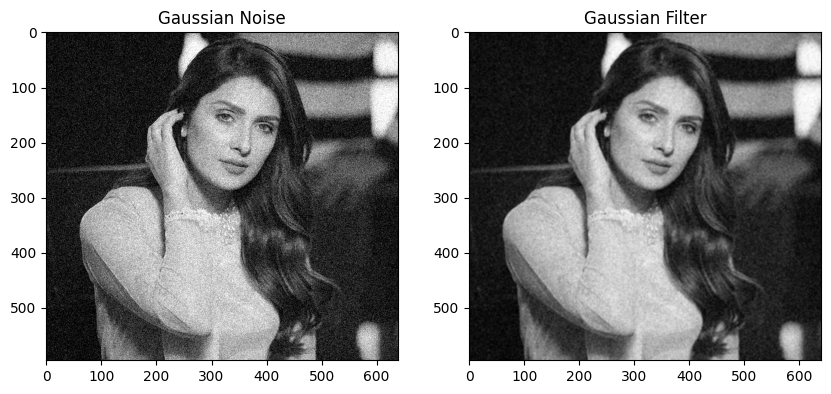

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread('/content/ayeza.jpg', cv2.IMREAD_GRAYSCALE) / 255.0

# Add Gaussian noise
def add_gaussian_noise(image, mean=0, var=0.01):
    sigma = var ** 0.5
    gaussian = np.random.normal(mean, sigma, image.shape)
    return np.clip(image + gaussian, 0, 1)

noisy_image = add_gaussian_noise(image)

# Apply Gaussian filter
denoised_image = cv2.GaussianBlur(noisy_image, (5, 5), 0)

# Display images
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(noisy_image, cmap='gray'), plt.title('Gaussian Noise')
plt.subplot(122), plt.imshow(denoised_image, cmap='gray'), plt.title('Gaussian Filter')
plt.show()


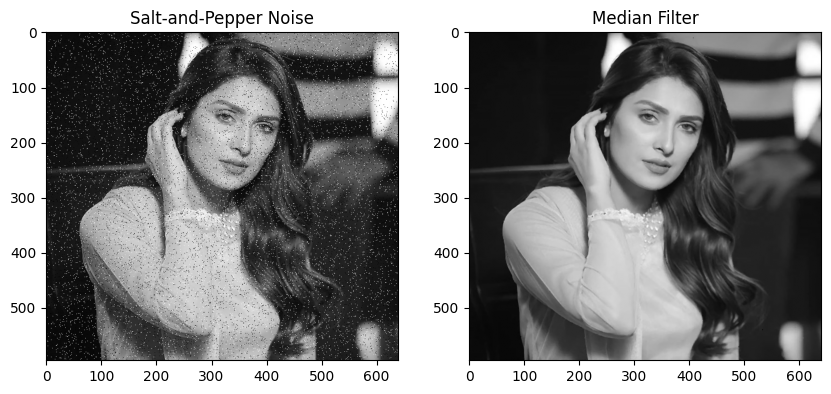

In [ ]:
# Add Salt-and-Pepper noise
def add_salt_and_pepper_noise(image, amount=0.05):
    noisy = image.copy()
    num_salt = np.ceil(amount * image.size * 0.5)
    num_pepper = np.ceil(amount * image.size * 0.5)

    # Salt noise
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy[coords[0], coords[1]] = 1

    # Pepper noise
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy[coords[0], coords[1]] = 0

    return noisy

noisy_image = add_salt_and_pepper_noise(image)

# Apply Median filter
denoised_image = cv2.medianBlur((noisy_image * 255).astype(np.uint8), 3)

# Display images
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(noisy_image, cmap='gray'), plt.title('Salt-and-Pepper Noise')
plt.subplot(122), plt.imshow(denoised_image, cmap='gray'), plt.title('Median Filter')
plt.show()


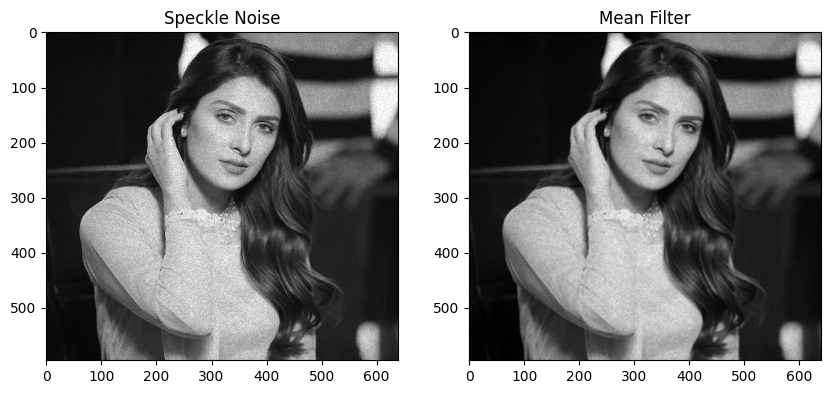

In [ ]:
# Add Speckle noise
def add_speckle_noise(image, var=0.01):
    speckle = np.random.normal(0, var ** 0.5, image.shape)
    return np.clip(image + image * speckle, 0, 1)

noisy_image = add_speckle_noise(image)

# Apply Mean filter
denoised_image = cv2.blur(noisy_image, (3, 3))

# Display images
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(noisy_image, cmap='gray'), plt.title('Speckle Noise')
plt.subplot(122), plt.imshow(denoised_image, cmap='gray'), plt.title('Mean Filter')
plt.show()


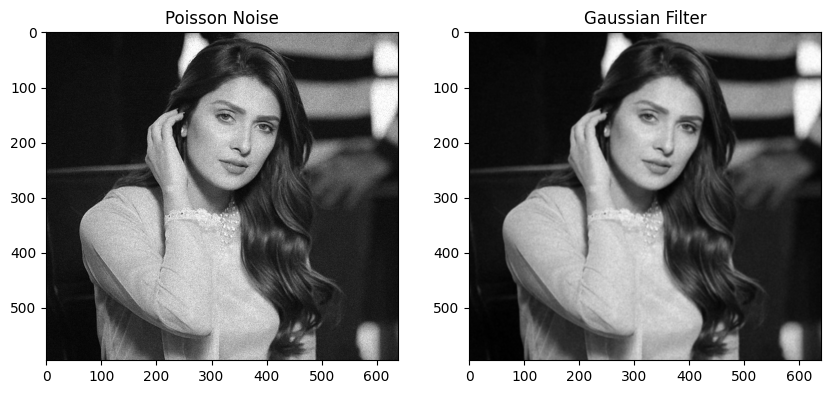

In [ ]:
# Add Poisson noise
def add_poisson_noise(image):
    noisy = np.random.poisson(image * 255) / 255.0
    return np.clip(noisy, 0, 1)

noisy_image = add_poisson_noise(image)

# Apply Gaussian filter as approximation
denoised_image = cv2.GaussianBlur(noisy_image, (5, 5), 0)

# Display images
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(noisy_image, cmap='gray'), plt.title('Poisson Noise')
plt.subplot(122), plt.imshow(denoised_image, cmap='gray'), plt.title('Gaussian Filter')
plt.show()


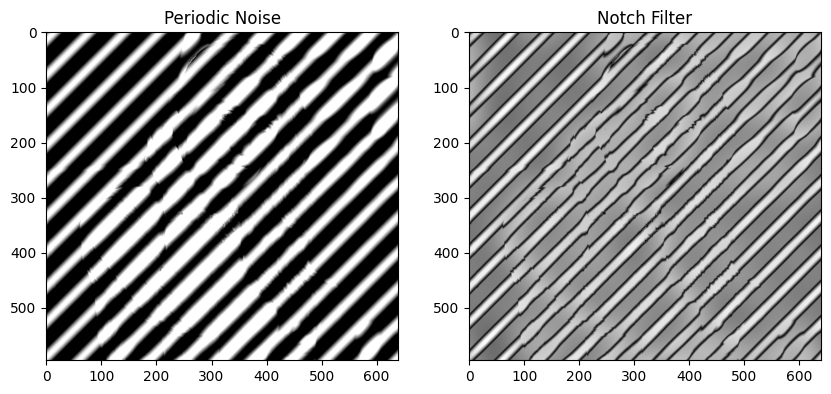

In [ ]:
# Add Periodic noise
def add_periodic_noise(image, frequency=10):
    rows, cols = image.shape
    x = np.linspace(0, cols, cols)
    y = np.linspace(0, rows, rows)
    x, y = np.meshgrid(x, y)
    sinusoid = np.sin(2 * np.pi * frequency * (x + y) / max(rows, cols))
    return np.clip(image + sinusoid, 0, 1)

noisy_image = add_periodic_noise(image)

# Apply Notch filter in frequency domain
dft = cv2.dft(np.float32(noisy_image), flags=cv2.DFT_COMPLEX_OUTPUT)
dft_shift = np.fft.fftshift(dft)

# Create a mask
rows, cols = noisy_image.shape
crow, ccol = rows // 2, cols // 2
mask = np.ones((rows, cols, 2), np.uint8)
mask[crow-5:crow+5, ccol-5:ccol+5] = 0

# Apply mask and inverse DFT
fshift = dft_shift * mask
f_ishift = np.fft.ifftshift(fshift)
img_back = cv2.idft(f_ishift)
img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

# Normalize and display
img_back = cv2.normalize(img_back, None, 0, 1, cv2.NORM_MINMAX)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(noisy_image, cmap='gray'), plt.title('Periodic Noise')
plt.subplot(122), plt.imshow(img_back, cmap='gray'), plt.title('Notch Filter')
plt.show()
